# Deep Learning School 
# Final project 2023: Object Detection
*Melnichenko A.N.*

Здравствуйте!

 Выбрал Object Detection, потому что эта часть computer vision очень сильно распространена и развивается как в промышленных предприятих, также в экологических отраслях страны, например, подсчет голов молодых оленей со съемки с вертолета,(хакатон от Евраза 2022). Поэтому, в этом итоговом проэкте хочу пройти полностью этап как детекции предобученной сети, так и дообучить модель на другом датасете, для детекции чего-то нового, не только тех классов которые были в базе COCO. 
    
 Хочу пройти этот пройти этот проэкт именно на низком уровне, то есть постараться применить стандартные библиотеки для трансформации, постараться написать цикл обучения и верификации без высокоуровневых библиотек как CATALISR и др., как сказал Илья Захаркин, нужно пройти этот путь от начала и до конца на низком уровне, чтоб знать, что происходит во время обучения и трансформации.
    
Основана работа на таких учебных материалах, как 
- детекция [занятия на продвинутом курсе](https://stepik.org/lesson/458312/step/1?unit=616130)

- практике CV [2019 года](https://www.youtube.com/watch?v=XSPYe4-y4HE)

- на основе [официального туториала](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)

- на основе туториала [Object Detection using PyTorch Faster RCNN](https://debuggercafe.com/custom-object-detection-using-pytorch-faster-rcnn/)

Структура проэкта:

- в первой части выбор фрейьворка `torchvision.models.detection` и `torchhub`: `FasterRCNN`.

- во второй запуск `FasterRCNN` для предобученного детектирования объектов на картинке.
  
- в третьей части выбор датасета. Я выбрал датасет для детекции `игральных карт`.
  
- в четвертой части произвести предобработку данных для подачи для дообучения в модель.

- в пятой части произвести обучение модели, как писал ранее умышлено хочу реализовать обучение на низком уровне.

- в шестой части произвести измерение качества модели.

- в седьмой части перечисленные кейсы использования модели, которая дообучена на датасете игральных карт


---

Классификация:

---

## Детектирование

*На основе [второй части обзора компьютерного зрения на Хабре](https://habr.com/ru/company/mipt/blog/458190/).*

<a href="https://ibb.co/fdb4M9j"><img src="https://i.ibb.co/b5xz1Fc/det1.png" alt="det1" border="0" width=600 /></a>

### Теория

Итак, задача звучит просто — дана картинка, необходимо найти на ней объекты заранее заданных классов (человек, книга, яблоко, артезиано-нормандский бассет-гриффон и т.д.). Объекты можно выделять на картинке **bounding box'ами (ограничивающие прямоугольники)** найденных классов 



Основные сети для детектирования: FasterRCNN, MaskRCNN, YOLOv3. Мы подробнее рассмотрим Faster-RCNN и MaskRCNN.

FasterRCNN обучена на датасете [Microsoft Common Objects in Conext (MS COCO)](http://cocodataset.org/#detection-2019).

Основная метрика -- Average Precision, 

**FasterRCNN** состоит из четырех частей: (1)Backbone, (2)RPN, (3)RoI-Pooling и (4)последние слои предсказания классов.

Важные термины:  

*Backbone* -- сеть для предсказания фич (например, ResNet50, или EfficientNet)    
*RoI* -- "Region of Interest"  
*RPN* -- "Region (of Interest) Proposal Network"   
*RoI-Pooling* -- "Region of Interest Pooling"     
*Anchor box* -- заранее заданный bounding box определенных размеров (обычно их для каждой "ячейки" от 3 до 9)

<a href="https://ibb.co/hYHjTcr"><img src="https://i.ibb.co/NTpPGrf/det2.png" alt="det2" border="0" width=700></a>

Загрузим FasterRCNN:

In [2]:
!pip install torchmetrics[detection]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.4/512.4 KB 34.9 MB/s eta 0:00:00


In [3]:
import torch
import torchvision
import cv2
import numpy as np
import os
import glob as glob
import albumentations as A
import time

from tqdm import tqdm
from xml.etree import ElementTree as et
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.utils.data import Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('/content/runs')

torch.multiprocessing.set_start_method('forkserver',force=True)

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
#import FastRCNNPredictor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# load a model pre-trained pre-trained on COCO
model_fast = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

## Download model and test on random foto

In [5]:
#!wget https://image.shutterstock.com/image-photo/group-people-260nw-602783837.jpg test.jpg
!wget https://sportishka.com/uploads/posts/2021-12/1639099956_20-sportishka-com-p-chelovek-ryadom-s-mashinoi-sport-krasivo-f-21.jpg
!mv 1639099956_20-sportishka-com-p-chelovek-ryadom-s-mashinoi-sport-krasivo-f-21.jpg test.jpg
!ls



--2023-01-29 13:16:42--  https://sportishka.com/uploads/posts/2021-12/1639099956_20-sportishka-com-p-chelovek-ryadom-s-mashinoi-sport-krasivo-f-21.jpg
Resolving sportishka.com (sportishka.com)... 178.32.177.146
Connecting to sportishka.com (sportishka.com)|178.32.177.146|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 242273 (237K) [image/jpeg]
Saving to: ‘1639099956_20-sportishka-com-p-chelovek-ryadom-s-mashinoi-sport-krasivo-f-21.jpg’

1639099956_20-sport 100%[===================>] 236.59K   746KB/s    in 0.3s    

2023-01-29 13:16:43 (746 KB/s) - ‘1639099956_20-sportishka-com-p-chelovek-ryadom-s-mashinoi-sport-krasivo-f-21.jpg’ saved [242273/242273]

runs  sample_data  test.jpg


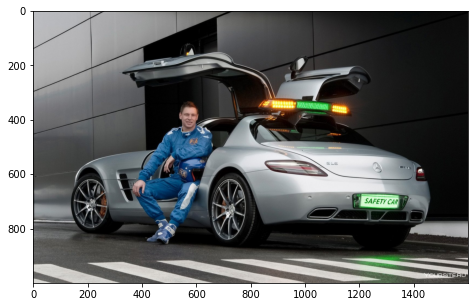

In [7]:
img_path = './test.jpg'
img = cv2.imread(img_path)[:,:,::-1]
fig = plt.figure(figsize=(10,5))
plt.imshow(img);

In [8]:
model_fast = model_fast.eval()
#img = cv2.imread(img_path)[:,:,::-1]
img = cv2.imread(img_path)
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
image /= 255.0
image = torch.from_numpy(image.astype('float32')).permute(2,0,1)
print(image.shape)

predictions = model_fast(image[None,...])
predictions

torch.Size([3, 1000, 1600])


[{'boxes': tensor([[ 369.8644,  336.1888,  669.5463,  857.4456],
          [ 559.8723,  288.9963, 1446.7117,  886.3463],
          [ 128.2494,  458.2647,  894.5790,  843.7607],
          [ 164.2464,  335.4488, 1253.5118,  848.0891],
          [ 817.1618,  167.1914, 1532.1792,  754.3226],
          [ 110.3404,  116.5088, 1545.9338,  861.0917],
          [ 312.6603,  131.0259,  914.7397,  687.9922],
          [ 139.2486,  264.1575,  913.2036,  845.2153],
          [ 861.3537,  202.2998, 1256.5774,  481.2583],
          [ 453.3189,  344.3947, 1061.6407,  750.9003],
          [ 383.0173,  281.1113,  849.1941,  856.8277],
          [ 182.3690,  505.1926,  814.9037,  846.2476],
          [ 307.5728,  110.7001,  921.1328,  701.0908],
          [ 160.8617,  148.9489, 1034.5387,  895.9503],
          [ 357.7886,  113.8596, 1449.6173,  724.8600],
          [ 723.5672,   57.6000, 1558.2910,  765.7593],
          [ 139.1226,  500.6643,  514.1678,  821.9543],
          [ 480.3825,  200.3078, 1190.0

In [10]:
def plot_preds(img, preds):
  boxes = preds['boxes'].detach().numpy().astype(np.int32)
  for box in boxes:
    #print(type(box[0]),box[1],box[2],box[3])
    cv2.rectangle(img, 
                  (int(box[0]),int(box[1])),
                  (int(box[2]), int(box[3])),
                  (255,0,),2)
  
  return img#.get() #get() -перевод в nummpy()

torch.Size([3, 1000, 1600])
<class 'torch.Tensor'>
(1000, 1600, 3)


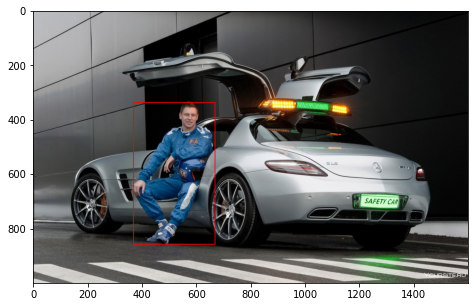

In [11]:
# test model on random foto
model = model_fast.eval()
img = cv2.imread(img_path)#[:,:,::-1]
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
image = torch.from_numpy(img.astype('float32')).permute(2,0,1)
image = image / 255.
print(image.shape)
predictions = model(image[None,...])

CONF_THRESH = 0.8
boxes = predictions[0]['boxes'][(predictions[0]['scores'] > CONF_THRESH) & (predictions[0]['labels'] == 1)]
print(type(boxes))
boxes_dict = {}
boxes_dict['boxes'] = boxes

img_with_boxes = plot_preds(img, boxes_dict)
print(img_with_boxes.shape)
fig = plt.figure(figsize=(10,5))
plt.imshow(img_with_boxes.astype('uint'));

### Сбор датасета

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!mkdir dataset

In [8]:
#Ссылка на датасет
!git clone https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10.git
%cd TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/

Cloning into 'TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10'...
remote: Enumerating objects: 1235, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 1235 (delta 17), reused 24 (delta 8), pack-reused 1199
Receiving objects: 100% (1235/1235), 57.70 MiB | 49.24 MiB/s, done.
Resolving deltas: 100% (627/627), done.
/content/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images


In [9]:
#%cd images
%cp -r train/ /content/dataset/ 
%cp -r test/ /content/dataset/
%cp train_labels.csv /content/dataset/
%cp test_labels.csv /content/dataset/

In [10]:
#moved img for inference in folder infer

import random
from pathlib import Path
path_new_dir = Path('/content/dataset/infer/')
path = Path('/content/dataset/test/')
def create_infer_folder(path, path_new_dir):
  path_new_dir.mkdir(parents=True, exist_ok = True)
 
  if path_new_dir.is_dir():
    print(path_new_dir)
    #!wget https://img.freepik.com/free-photo/casino-cards-on-yellow-background_23-2148952384.jpg
    !wget http://selfire.com/wp-content/uploads/2013/01/Атласные-А.Шарлеманя.jpg
    #!wget https://img.freepik.com/free-vector/ace-of-diamonds-playing-card-isolated_1308-78919.jpg
    #%mv casino-cards-on-yellow-background_23-2148952384.jpg {path_new_dir}/infer.jpg
    %mv Атласные-А.Шарлеманя.jpg {path_new_dir}/infer.jpg
    #%mv ace-of-diamonds-playing-card-isolated_1308-78919.jpg {path_new_dir}/infer.jpg
    print('Ok')

create_infer_folder(path, path_new_dir)

/content/dataset/infer
--2023-01-29 13:17:30--  http://selfire.com/wp-content/uploads/2013/01/%D0%90%D1%82%D0%BB%D0%B0%D1%81%D0%BD%D1%8B%D0%B5-%D0%90.%D0%A8%D0%B0%D1%80%D0%BB%D0%B5%D0%BC%D0%B0%D0%BD%D1%8F.jpg
Resolving selfire.com (selfire.com)... 159.69.19.11
Connecting to selfire.com (selfire.com)|159.69.19.11|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 318270 (311K) [image/jpeg]
Saving to: ‘Атласные-А.Шарлеманя.jpg’

Атласные-А.Шарлеман 100%[===================>] 310.81K   843KB/s    in 0.4s    

2023-01-29 13:17:30 (843 KB/s) - ‘Атласные-А.Шарлеманя.jpg’ saved [318270/318270]

Ok


conf

In [11]:
BATCH_SIZE = 4 # increase / decrease according to GPU memeory
RESIZE_TO = 300 # resize the image for training and transforms 512
NUM_EPOCHS = 20 # number of epochs to train for
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# training images and XML files directory
TRAIN_DIR = '/content/dataset/train/'
# validation images and XML files directory
VALID_DIR = '/content/dataset/test/'
# classes: 0 index is reserved for background
CLASSES = [
    'background', 'nine', 'ten', 'jack', 'queen','king','ace'
]
NUM_CLASSES = 7
# whether to visualize images after crearing the data loaders
VISUALIZE_TRANSFORMED_IMAGES = False
# location to save model and plots
OUT_DIR = '/content/drive/MyDrive/DLS'
SAVE_PLOTS_EPOCH = 2 # save loss plots after these many epochs
SAVE_MODEL_EPOCH = 2 # save model after these many epochs

utils

In [12]:
#Averager class for loss
class Averager:
  def __init__(self):
    self.current_total = 0.0
    self.iterations = 0.0
  
  def send(self, value):
    self.current_total += value
    self.iterations += 1
    
  @property
  def value(self):
    if self.iterations == 0:
      return 0
    else:
      return 1.0 * self.current_total / self.iterations

  def reset(self):
    self.current_total = 0.0
    self.iterations = 0.0



def collate_fn(batch):
  return tuple(zip(*batch))



#transform
def get_train_transform():
  return A.Compose([
      A.Flip(0.5),
      A.RandomRotate90(0.5),
      A.MotionBlur(p=0.2),
      A.MedianBlur(blur_limit=3, p=0.1),
      A.Blur(blur_limit=3, p=0.1),
      ToTensorV2(p=0.1),
  ], bbox_params={
      'format':'pascal_voc',
      'label_fields':['labels']
  })

  #validation transform
def get_valid_transform():
  return A.Compose([
      ToTensorV2(p=0.1),
  ],bbox_params={
    'format':'pascal_voc',
    'label_fields':['labels']
  })


def show_transformed_image(train_loader):
  if len(train_loader) > 0:
    for i in range(1):
      images, targets = next(iter(train_loader))
      images = list(image.to(DEVICE) for image in images)
      targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
      boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
      sample = images[i].permute(1,2,0).cpu().numpy()
      for box in boxes:
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 0, 255), 2)
      
        plt.imshow(sample)
        plt.show()

In [13]:
#from torch.utils.data import Dataset, DataLoader
class CardsDataset(Dataset):
  def __init__(self, dir_path,width,height, classes, transforms=None):
    self.dir_path = dir_path
    self.width = width
    self.height = height
    self.classes = classes
    self.transforms = transforms

    types = ('*.JPG','*.jpg')
    self.images_path = [glob.glob(f"{self.dir_path}{files}") for files in types]
    self.all_images = [path_image.split('/')[4] for img_path in self.images_path
                                  for path_image in img_path]
    self.all_images = sorted(self.all_images)

  def __getitem__(self, index):
    #name imge in index
    image_name = self.all_images[index]
    #print(image_name)
    path_image = os.path.join(self.dir_path, image_name)

    #img in array cv2
    image = cv2.imread(path_image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    #resize
    image_resize = cv2.resize(image, (self.width, self.height))
    image_resize /= 255.0

    #get annotation from XML
    annot_name = image_name.split('.')[0] + '.xml'
    annot_file_path = os.path.join(self.dir_path, annot_name)

    #parse xml annotation
    boxes = []
    labels = []

    tree = et.parse(annot_file_path)
    root = tree.getroot()

    image_width = image.shape[1]
    image_height = image.shape[0]
    
    for member in root.findall('object'):
      labels.append(self.classes.index(member.find('name').text))

      #xmin = left x
      xmin = int(member.find('bndbox').find('xmin').text)
      #xmax = rigth x
      xmax = int(member.find('bndbox').find('xmax').text)
      #ymin = left y
      ymin = int(member.find('bndbox').find('ymin').text)
      #ymax = right y
      ymax = int(member.find('bndbox').find('ymax').text)

      #compute with resize coordinate
      xmin_resize = (xmin / image_width) * self.width #x -> width coord os
      xmax_resize = (xmax / image_width) * self.width
      ymin_resize = (ymin / image_height) * self.height #y -> hight coord os
      ymax_resize = (ymax / image_height) * self.height

      #in list boxes
      boxes.append([xmin_resize, ymin_resize, xmax_resize, ymax_resize])

    #bb to tensor
    boxes = torch.as_tensor(boxes, dtype=torch.float32)
    #area of bb
    area = (boxes[:,3] - boxes[:,1]) * (boxes[:,2] - boxes[:,0])
    # no crowd instances
    iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
    #label to tensor
    labels = torch.as_tensor(labels, dtype=torch.int64)

    #final target dictionary
    target = {}
    target['boxes'] = boxes
    target['labels'] = labels
    target['area'] = area
    target['iscrowd'] = iscrowd
    image_id = torch.tensor([index])
    target['image_id'] = image_id

    #transformation
    if self.transforms:
      sample = self.transforms(image = image_resize,
                               bboxes = target['boxes'],
                               labels = labels)
      image_resize = sample['image']
      target['boxes'] = torch.Tensor(sample['bboxes'])
    return image_resize, target

  def __len__(self):
    return len(self.all_images)

creating data loader

In [21]:
train_dataset = CardsDataset(TRAIN_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform())
valid_dataset = CardsDataset(VALID_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform())
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers = 0,
    collate_fn = collate_fn
)
valid_loader = DataLoader(
    valid_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True,
    num_workers = 0,
    collate_fn = collate_fn
)

print(f'Count of training samples: {len(train_dataset)}')
print(f'Count of valid samples: {len(valid_dataset)}')

Count of training samples: 296
Count of valid samples: 67


VISUAL

Number of training images: 296


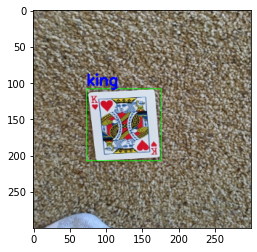

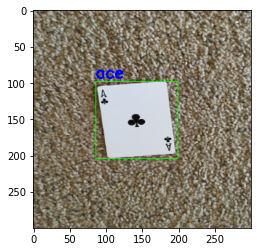

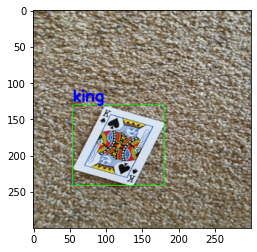

In [22]:
from google.colab.patches import cv2_imshow
dataset = CardsDataset(TRAIN_DIR, RESIZE_TO, RESIZE_TO, CLASSES)
print(f"Number of training images: {len(dataset)}")

#function visual
def visualize_sample(image, target):
  box = target['boxes'][0]
  label = CLASSES[target['labels'][0]]
  cv2.rectangle(
      image,
      (int(box[0]), int(box[1])),(int(box[2]), int(box[3])),
      (0,255,0),1
  )
  cv2.putText(
      image,label,(int(box[0]),int(box[1] - 5)),
      cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2
  )
  
  
  
  plt.imshow(np.array(image, dtype=np.float32))
  plt.show()

samples = 3
for i in range(samples):
  image, target = dataset[i]
  visualize_sample(image, target)


## Fine tuning FastRCNN and trainig for new dataset

model FastRCNN

In [14]:
def tuning_model(num_classes):
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
  #get the number of input features
  in_features = model.roi_heads.box_predictor.cls_score.in_features
  #define a new num_classes of detectors
  model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
  
  return model

define function for train

In [15]:
def train(train_data_loader, model, optimizer, lr_scheduler = None):
  print('train...')
  train_itr = 0
  train_loss_list = []

  #tqdm
  model.train()
  prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

  for i, data in enumerate(prog_bar):
    optimizer.zero_grad()
    images, targets = data

    images = list(image.to(DEVICE) for image in images)
    targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
    
    loss_dict = model(images,targets) #predict
    #print(loss_dict[0])
    
    losses = sum(loss for loss in loss_dict.values())
    
    loss_value = losses.item()
    
    train_loss_list.append(loss_value)

    train_loss_h.send(loss_value)

    

    losses.backward()
    optimizer.step()

    if lr_scheduler is not None:
      lr_scheduler.step()
    train_itr += 1

    prog_bar.set_description(desc = f"Loss: {loss_value:.4f}")
  return train_loss_list

define validation

In [16]:
# from torchmetrics.detection.mean_ap import MeanAveragePrecision
metric = MeanAveragePrecision() #pytorch metrics
def validate(valid_data_loader, model):
  print('validate...')
  val_itr = 0
  map_loss_list = [] 
  
  model.eval()
  with torch.no_grad():
    for images, targets in valid_data_loader:
      
      images = list(image.to(DEVICE) for image in images)
      targets = list({k: v.to(DEVICE) for k, v in target.items()} for target in targets)      
      loss_dict = model(images, targets)     
      metric.update(loss_dict, targets)
      map = metric.compute()['map']
      map_loss_list.append(map)
      val_loss_h.send(map)
  
  return map_loss_list

training

In [28]:
from torch.optim import lr_scheduler
FRCNN_ch = tuning_model(num_classes=NUM_CLASSES)
FRCNN_ch = FRCNN_ch.to(DEVICE)

#load best weights for new training
FRCNN_ch.load_state_dict(torch.load(OUT_DIR + '/' + 'FRCNN_100_end_1.pth', map_location=DEVICE)) # до обучаю модель по возможности от выделения gpu colab

optimizer = torch.optim.Adam(FRCNN_ch.parameters(), lr=3e-4, weight_decay=0.0005) # SGD momentum=0.9,
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3,gamma=0.1)

#object for tensorboard
writer = SummaryWriter('/content/runs')

#loss class monitoring
train_loss_h = Averager()
val_loss_h = Averager()

train_loss_list = []
val_loss_list = []

MODEL_NAME = 'FRCNN_tuning'




if VISUALIZE_TRANSFORMED_IMAGES:
  show_transformed_image(train_loader)

#start train epoch
for epoch in range(NUM_EPOCHS): #NUM_EPOCHS
  print(f'\nepoch {epoch + 1} of {NUM_EPOCHS}')

  #reset the histories for current epoch
  train_loss_h.reset()
  val_loss_h.reset()

  start = time.time()
  train_loss = train(train_loader, FRCNN_ch, optimizer, lr_scheduler = None)
  train_loss_list.extend(train_loss)
  
  map_list = validate(valid_loader, FRCNN_ch)
  val_loss_list.extend(map_list)
   
  #значения и время эпохи
  print(f"Epoch #{epoch + 1} train loss: {train_loss_h.value:.3f}")   
  print(f"Epoch #{epoch + 1} mAP compute on epoch: {val_loss_h.value:.5f}")   

  end = time.time()

  print(f"Time on epoch {((end - start)/60):.3f} minutes, epoch - {epoch+1}")
  
  if (epoch + 1) % SAVE_MODEL_EPOCH:   
    torch.save(FRCNN_ch.state_dict(), f"{OUT_DIR}/FRCNN_{epoch+1}_mAP_{val_loss_h.value:.5f}.pth") #train_loss_list[-1]
    print(f'Saving model complete...\n')

  
  if (epoch+1) == NUM_EPOCHS:
    print('The last epoch ...\n')
    print('Write data for tensorboard...\n')
    for i in range(len(train_loss_list)):
      writer.add_scalar('runs/train', train_loss_list[i], i)
    for i in range(len(val_loss_list)):
      writer.add_scalar('runs/val',val_loss_list[i], i)

    writer.flush()
    writer.close()

    print(f"Saved last weigth...")
    torch.save(FRCNN_ch.state_dict(), f"{OUT_DIR}/FRCNN_{epoch+1}_end.pth")

%load_ext tensorboard
%tensorboard --logdir /content/runs



/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



epoch 1 of 10
train...


Loss: 0.3959: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #1 train loss: 0.445
Epoch #1 mAP compute on epoch: 0.14617
Time on epoch 2.179 minutes, epoch - 1
Saving model complete...


epoch 2 of 10
train...


Loss: 0.1240: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #2 train loss: 0.256
Epoch #2 mAP compute on epoch: 0.18667
Time on epoch 2.712 minutes, epoch - 2

epoch 3 of 10
train...


Loss: 0.1619: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #3 train loss: 0.226
Epoch #3 mAP compute on epoch: 0.21470
Time on epoch 3.225 minutes, epoch - 3
Saving model complete...


epoch 4 of 10
train...


Loss: 0.1928: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #4 train loss: 0.215
Epoch #4 mAP compute on epoch: 0.23040
Time on epoch 3.734 minutes, epoch - 4

epoch 5 of 10
train...


Loss: 0.1592: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #5 train loss: 0.196
Epoch #5 mAP compute on epoch: 0.24540
Time on epoch 4.223 minutes, epoch - 5
Saving model complete...


epoch 6 of 10
train...


Loss: 0.1289: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #6 train loss: 0.179
Epoch #6 mAP compute on epoch: 0.26459
Time on epoch 4.722 minutes, epoch - 6

epoch 7 of 10
train...


Loss: 0.0920: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #7 train loss: 0.178
Epoch #7 mAP compute on epoch: 0.27428
Time on epoch 5.214 minutes, epoch - 7
Saving model complete...


epoch 8 of 10
train...


Loss: 0.2588: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #8 train loss: 0.174
Epoch #8 mAP compute on epoch: 0.28305
Time on epoch 5.684 minutes, epoch - 8

epoch 9 of 10
train...


Loss: 0.1764: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #9 train loss: 0.190
Epoch #9 mAP compute on epoch: 0.28706
Time on epoch 6.158 minutes, epoch - 9
Saving model complete...


epoch 10 of 10
train...


Loss: 0.1011: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #10 train loss: 0.173
Epoch #10 mAP compute on epoch: 0.29468
Time on epoch 6.611 minutes, epoch - 10
The last epoch ...

Write data for tensorboard...

Saved last weigth...
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 3195), started 0:47:19 ago. (Use '!kill 3195' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# ВТОРОЙ ЗАПУСК ОБУЧЕНИЯ ПОСЛЕ ОТКЛЮЧЕНИЯ GPU
# from torch.optim import lr_scheduler
# FRCNN_ch = tuning_model(num_classes=NUM_CLASSES)
# FRCNN_ch = FRCNN_ch.to(DEVICE)

# #load best weights for new training
# FRCNN_ch.load_state_dict(torch.load(OUT_DIR + '/' + 'FRCNN_10_end.pth', map_location=DEVICE)) # до обучаю модель по возможности от выделения gpu colab

# optimizer = torch.optim.Adam(FRCNN_ch.parameters(), lr=3e-4, weight_decay=0.0005) # SGD momentum=0.9,
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3,gamma=0.1)

# #object for tensorboard
# writer = SummaryWriter('/content/runs')

# #loss class monitoring
# train_loss_h = Averager()
# val_loss_h = Averager()

# train_loss_list = []
# val_loss_list = []

# MODEL_NAME = 'FRCNN_tuning'




# if VISUALIZE_TRANSFORMED_IMAGES:
#   show_transformed_image(train_loader)

# #start train epoch
# for epoch in range(NUM_EPOCHS): #NUM_EPOCHS
#   print(f'\nepoch {epoch + 11} of {NUM_EPOCHS}')

#   #reset the histories for current epoch
#   train_loss_h.reset()
#   val_loss_h.reset()

#   start = time.time()
#   train_loss = train(train_loader, FRCNN_ch, optimizer, lr_scheduler = None)
#   train_loss_list.extend(train_loss)
  
#   map_list = validate(valid_loader, FRCNN_ch)
#   val_loss_list.extend(map_list)
   
#   #значения и время эпохи
#   print(f"Epoch #{epoch + 1} train loss: {train_loss_h.value:.3f}")   
#   print(f"Epoch #{epoch + 1} mAP compute on epoch: {val_loss_h.value:.5f}")   

#   end = time.time()

#   print(f"Time on epoch {((end - start)/60):.3f} minutes, epoch - {epoch+1}")
  
#   if (epoch + 1) % SAVE_MODEL_EPOCH:   
#     torch.save(FRCNN_ch.state_dict(), f"{OUT_DIR}/FRCNN_{epoch+1}_mAP_{val_loss_h.value:.5f}.pth") #train_loss_list[-1]
#     print(f'Saving model complete...\n')

  
#   if (epoch+1) == NUM_EPOCHS:
#     print('The last epoch ...\n')
#     print('Write data for tensorboard...\n')
#     for i in range(len(train_loss_list)):
#       writer.add_scalar('runs/train', train_loss_list[i], i)
#     for i in range(len(val_loss_list)):
#       writer.add_scalar('runs/val',val_loss_list[i], i)

#     writer.flush()
#     writer.close()

#     print(f"Saved last weigth...")
#     torch.save(FRCNN_ch.state_dict(), f"{OUT_DIR}/FRCNN_{epoch+1}_end2.pth")

# %load_ext tensorboard
# %tensorboard --logdir /content/runs


epoch 11 of 20
train...


Loss: 0.1418: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #1 train loss: 0.205
Epoch #1 mAP compute on epoch: 0.29706
Time on epoch 7.123 minutes, epoch - 1
Saving model complete...


epoch 12 of 20
train...


Loss: 0.2390: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #2 train loss: 0.171
Epoch #2 mAP compute on epoch: 0.30069
Time on epoch 7.549 minutes, epoch - 2

epoch 13 of 20
train...


Loss: 0.1451: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #3 train loss: 0.192
Epoch #3 mAP compute on epoch: 0.30363
Time on epoch 7.978 minutes, epoch - 3
Saving model complete...


epoch 14 of 20
train...


Loss: 0.1699: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #4 train loss: 0.174
Epoch #4 mAP compute on epoch: 0.30627
Time on epoch 8.439 minutes, epoch - 4

epoch 15 of 20
train...


Loss: 0.2829: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #5 train loss: 0.178
Epoch #5 mAP compute on epoch: 0.31021
Time on epoch 8.948 minutes, epoch - 5
Saving model complete...


epoch 16 of 20
train...


Loss: 0.0907: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #6 train loss: 0.177
Epoch #6 mAP compute on epoch: 0.31364
Time on epoch 9.300 minutes, epoch - 6

epoch 17 of 20
train...


Loss: 0.1396: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #7 train loss: 0.163
Epoch #7 mAP compute on epoch: 0.31685
Time on epoch 9.721 minutes, epoch - 7
Saving model complete...


epoch 18 of 20
train...


Loss: 0.3389: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #8 train loss: 0.173
Epoch #8 mAP compute on epoch: 0.31982
Time on epoch 10.182 minutes, epoch - 8

epoch 19 of 20
train...


Loss: 0.2016: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #9 train loss: 0.178
Epoch #9 mAP compute on epoch: 0.32277
Time on epoch 10.722 minutes, epoch - 9
Saving model complete...


epoch 20 of 20
train...


Loss: 0.3122: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #10 train loss: 0.175
Epoch #10 mAP compute on epoch: 0.32517
Time on epoch 11.202 minutes, epoch - 10

epoch 21 of 20
train...


Loss: 0.0783: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #11 train loss: 0.184
Epoch #11 mAP compute on epoch: 0.32726
Time on epoch 11.613 minutes, epoch - 11
Saving model complete...


epoch 22 of 20
train...


Loss: 0.1217: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...
Epoch #12 train loss: 0.173
Epoch #12 mAP compute on epoch: 0.33053
Time on epoch 13.113 minutes, epoch - 12

epoch 23 of 20
train...


Loss: 0.1320: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #13 train loss: 0.198
Epoch #13 mAP compute on epoch: 0.33124
Time on epoch 14.967 minutes, epoch - 13
Saving model complete...


epoch 24 of 20
train...


Loss: 0.2042: 100%|██████████| 74/74 [00:56<00:00,  1.31it/s]


validate...
Epoch #14 train loss: 0.205
Epoch #14 mAP compute on epoch: 0.33193
Time on epoch 13.395 minutes, epoch - 14

epoch 25 of 20
train...


Loss: 0.1054: 100%|██████████| 74/74 [00:56<00:00,  1.32it/s]


validate...


Метрика mAP здесь представлена как графическое отображение правильности предсказания модели. Первый график показывает ошибку при обучении модели. Так как колаб отключает GPU, то приходится до обучать модель частями пока работает GPU, и поэтому график выглядит не большим, получается провести всего 17 эпох на выделенное время колабом. Поэтому обучение производится по 10 эпох. На данный момент метрика mAP = 0.32726, судя по графику есть тенденция роста по качеству, но вот loss на трейне иногда поднимается на высокое значение, затем на низкие значения, есть "колебания" ошибки, но все равно снижается. Я думаю это из-за не большого набора данных и в какой-то момент модель переобучается. Думаю что сейчас до сдачи проекта, я не добьюсь хорошего качества модели, так как мало времени выделяется на GPU, без подключения видеокарты, одна эпоха занимает 1час 20мин, что критично, тем более так же отключение колаба из-за бездействия. Так же, я подошел к шагу обучения вот ближе к сдаче проекта.

inference

In [20]:
#define function for visual inference
def plots_preds(img, preds):
  boxes = preds['boxes'].detach().numpy().astype(np.int32)
  
  for i in range(len(preds['boxes'])):
    label = CLASSES[preds['labels'][i]]
    #print(type(box[0]),box[1],box[2],box[3])
    cv2.rectangle(img, 
                  (int(boxes[i][0]),int(boxes[i][1])),
                  (int(boxes[i][2]), int(boxes[i][3])),
                  (255,0,),2)
    print(label)
    cv2.putText(
      img,label,(int(boxes[i][0]+3),int(boxes[i][1] - 2)),
      cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
  fig = plt.figure(figsize=(12,8))
  plt.imshow(img[:,:,::-1].astype('uint'))
  #plt.imshow(image.astytpe('uint'))
  plt.show()

In [30]:
#inference
inf_img = cv2.imread('/content/dataset/infer/infer.jpg')
inf_image = cv2.cvtColor(inf_img, cv2.COLOR_BGR2RGB).astype(np.float32)
inf_image /= 255.0
inf_image = torch.from_numpy(inf_image.astype('float32')).permute(2,0,1)
print(inf_image.shape)

#собираю модель для inference
FRCNN_ch = tuning_model(num_classes=NUM_CLASSES)
FRCNN_ch = FRCNN_ch.to(DEVICE)

#load best weights for new training
FRCNN_ch.load_state_dict(torch.load(OUT_DIR + '/' + 'FRCNN_13_mAP_0.33124.pth', map_location=DEVICE)) #FRCNN_11_mAP_0.32726, FRCNN_13_mAP_0.33124, FRCNN_10_end
FRCNN_ch.eval()
predict = FRCNN_ch(inf_image[None,...])
predict

torch.Size([3, 785, 698])


[{'boxes': tensor([[  0.0000, 249.1908, 169.3678, 519.7119],
          [180.8640, 246.4673, 339.8833, 523.6446],
          [341.9934, 251.9437, 520.9409, 520.8074],
          [166.9069, 511.2793, 345.7077, 785.0000],
          [  7.7352, 505.8109, 170.5594, 785.0000],
          [341.3079, 513.3040, 521.0991, 785.0000],
          [180.2277, 536.4915, 337.4482, 776.8516],
          [  0.0000,   0.0000, 168.7241, 260.0804],
          [526.2907,   3.1178, 684.4188, 264.1449],
          [  0.0000, 528.7938, 166.3120, 782.1755],
          [348.9397, 270.9724, 512.7866, 504.7893],
          [528.4957, 248.2964, 689.9622, 530.8305],
          [351.7826,   0.0000, 519.3009, 258.1942],
          [521.5386, 527.8464, 686.2077, 776.2435],
          [359.9057, 534.9792, 511.0908, 776.7745],
          [524.8364, 261.4441, 684.8178, 525.7198],
          [  0.0000,  18.1091, 149.5093, 229.0060],
          [178.5648, 268.7588, 337.3481, 507.6026],
          [171.2052,   4.6431, 341.6288, 255.5971],
   

После полученных данных, то есть получив предикт, фильтруем количество bounding box по порогу, так как модель определила много bounding box, чтобы получить представление как модель определяет карты.

In [31]:
# filters for threshold boxes and labels
box_dict = {}
threshold = 0.41
boxes = predict[0]['boxes'][(predict[0]['scores'] > threshold)] # & (predict[0]['labels'] == 1 

labels = predict[0]['labels'][predict[0]['scores'] > threshold]
box_dict['boxes'] = boxes
box_dict['labels'] = labels
box_dict

{'boxes': tensor([[  0.0000, 249.1908, 169.3678, 519.7119],
         [180.8640, 246.4673, 339.8833, 523.6446],
         [341.9934, 251.9437, 520.9409, 520.8074],
         [166.9069, 511.2793, 345.7077, 785.0000],
         [  7.7352, 505.8109, 170.5594, 785.0000],
         [341.3079, 513.3040, 521.0991, 785.0000],
         [180.2277, 536.4915, 337.4482, 776.8516],
         [  0.0000,   0.0000, 168.7241, 260.0804],
         [526.2907,   3.1178, 684.4188, 264.1449],
         [  0.0000, 528.7938, 166.3120, 782.1755],
         [348.9397, 270.9724, 512.7866, 504.7893],
         [528.4957, 248.2964, 689.9622, 530.8305],
         [351.7826,   0.0000, 519.3009, 258.1942],
         [521.5386, 527.8464, 686.2077, 776.2435]], grad_fn=<IndexBackward0>),
 'labels': tensor([5, 5, 5, 5, 5, 5, 3, 5, 3, 3, 3, 5, 5, 3])}

king
king
king
king
king
king
jack
king
jack
jack
jack
king
king
jack


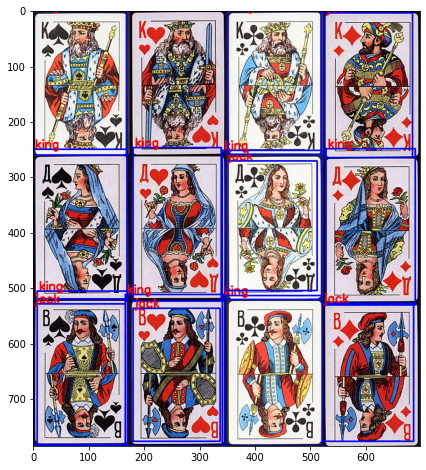

In [32]:
plots_preds(inf_img, box_dict)

В результате, рамками правильное выделение карт, не правильно определила модель класс QUEEN, KING and JACK  определила правильно. Нужно до обучить модель, сейчас инференс проходит на mAP=0.33124, при loss=0.12 (epoch=23, с определением эпох немного ошибся, спешил). Все таки тенденция на обучение модели сохраняется, судя по графику tensorboard выше и по показателям обучения ниже, (где отключился gpu).

Отвечая на вопрос поиск путей применения этой модели в бизнесе/реальных задачах/ - я решил делать детекцию на игральных картах, потому что сейчас сильно развивается роботостроение в мире, и для такой опции робота как развлечение, можно применить игру в карты в дурака,по идее, чтоб с роботом можно было играть в карты, например в "Дурака"). Конечно для быстрого детектирования объектов по видео, лучше применить одностадийную модель, не двухстадийную как FastRCNN. А одностадийные это такие как SSD, YOLO. Для того чтоб применить, нужно до обучить модель, чтоб качество модели было высокое, и например расположить модель на raspberry pi python, так как это мииникомпьютер, к нему будут подведены интерфейсы видеокамеры. Надо прописать логику игры также. И в теории, будет детектироваться и определяться карта с помощью модели, слудующий шаг будет подаваться эта карта в логику игры и по выводу логики игры будет сделан роботом "шаг" игры. Вот такой pipeline я вижу применения модели детектирования для игральных карт.